In [ ]:
import numpy as np
import pandas as pd
import scanpy as sc
import scFates as scf

from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)
import matplotlib.pyplot as plt
sc.set_figure_params()
scf.set_figure_pubready()

In [2]:
adata=sc.read("data/adata_HC.h5ad")

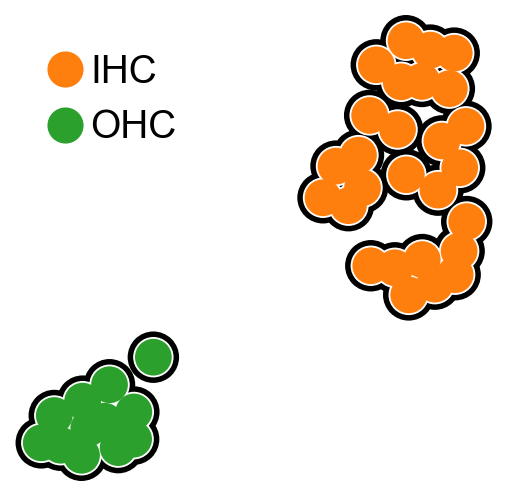

In [3]:
import scvelo as scv
scv.set_figure_params(figsize=(3,3),dpi_save=300)

ax=scv.pl.umap(adata,color="leiden",s=700,title="",
               legend_loc="none",show=False,add_outline=True,outline_width=(0.15, 0.05),clip_on=False)
lgd=ax.legend(loc=2,markerscale=2, frameon=False,fontsize=14,scatteryoffsets =[.5])
plt.savefig("figures/fig5a.pdf")

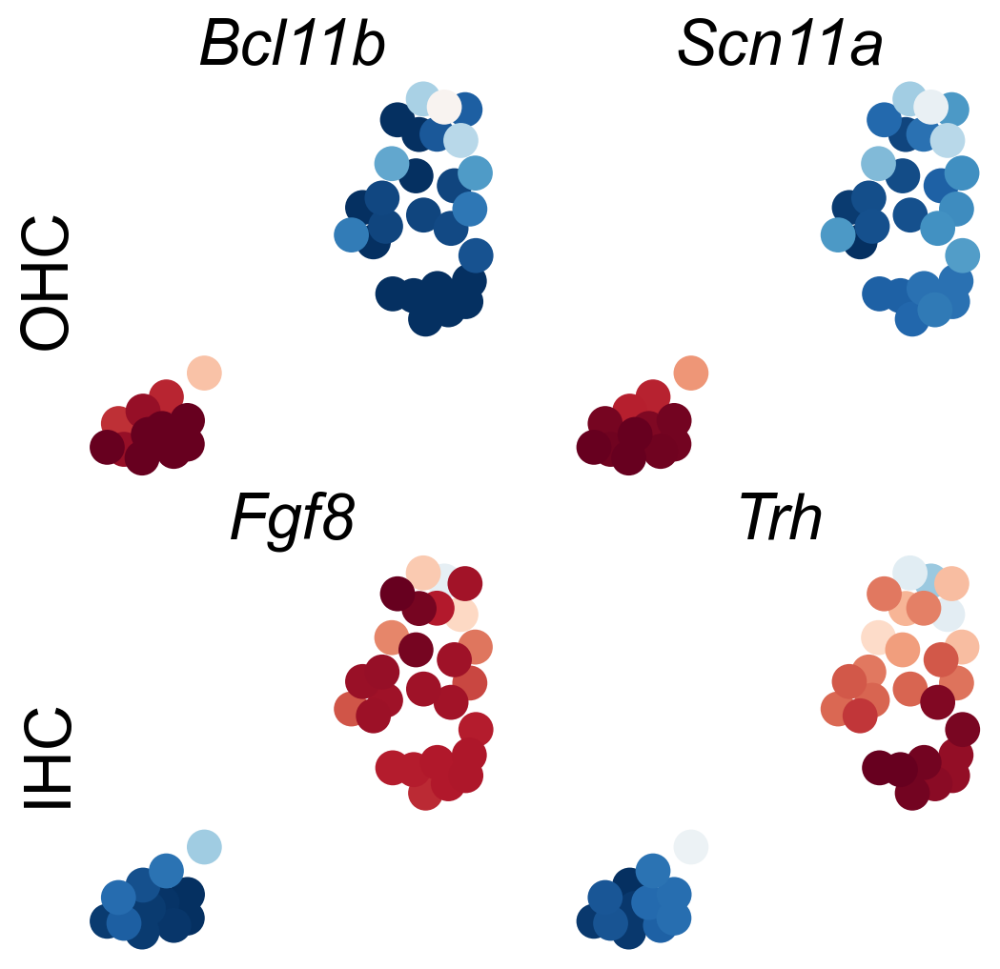

In [4]:
fig, axs = plt.subplots(2,2,figsize=(6,6),gridspec_kw=dict(wspace=.2,hspace=.2))
axs=axs.ravel()
for i,g in enumerate(['Bcl11b','Scn11a','Fgf8',"Trh"]):
    scv.pl.umap(adata, color=g,smooth=True,title="",cmap="RdBu_r",s=700,ax=axs[i],show=False,colorbar=False)
    axs[i].set_title(g,style="italic",fontsize=24)

axs[0].set_ylabel("OHC",fontsize=24)
axs[2].set_ylabel("IHC",fontsize=24)
plt.savefig("figures/fig5b.pdf")

In [5]:
sc.tl.rank_genes_groups(adata,"leiden",method="wilcoxon")

In [16]:
sc.get.rank_genes_groups_df(adata,"IHC",pval_cutoff=0.05).shape[0]

1087

In [17]:
adata_all=sc.read("data/adata_aligned.h5ad")

In [20]:
adata_all=adata_all[adata_all.obs.leiden=="18"]

In [22]:
adata_all.obs["Vestibular"]=(~adata_all.obs_names.isin(adata.obs_names)).astype(str)

Trying to set attribute `.obs` of view, copying.


In [23]:
sc.tl.rank_genes_groups(adata_all,"Vestibular",method="wilcoxon")

... storing 'Vestibular' as categorical


In [28]:
sc.get.rank_genes_groups_df(adata_all,"True",pval_cutoff=0.05,log2fc_min=0).set_index("names").to_csv("data/Vestibular_HC.csv")

In [29]:
sc.get.rank_genes_groups_df(adata,"IHC",pval_cutoff=0.05)

,names,scores,logfoldchanges,pvals,pvals_adj
0,Fam19a3,4.929503,10.063061,8.243906e-07,0.000433
1,Gm9047,4.929503,4.589648,8.243906e-07,0.000433
2,Fgf8,4.929503,9.201370,8.243906e-07,0.000433
3,S100a1,4.899074,1.746866,9.628938e-07,0.000433
4,Cabp2,4.899074,8.977735,9.628938e-07,0.000433
...,...,...,...,...,...
1082,Arhgef3,-4.929503,-8.074535,8.243906e-07,0.000433
1083,Efna5,-4.929503,-6.809744,8.243906e-07,0.000433
1084,Ifitm2,-4.929503,-2.597303,8.243906e-07,0.000433
1085,Gse1,-4.929503,-3.012078,8.243906e-07,0.000433


In [11]:
writer = pd.ExcelWriter('data/HC_DE.xlsx', engine='xlsxwriter')
for cl in adata.obs.leiden.cat.categories:
    sc.get.rank_genes_groups_df(adata,cl,pval_cutoff=0.05,log2fc_min=0).set_index("names").to_excel(writer, 
                                                                     sheet_name=cl)
    
writer.save()

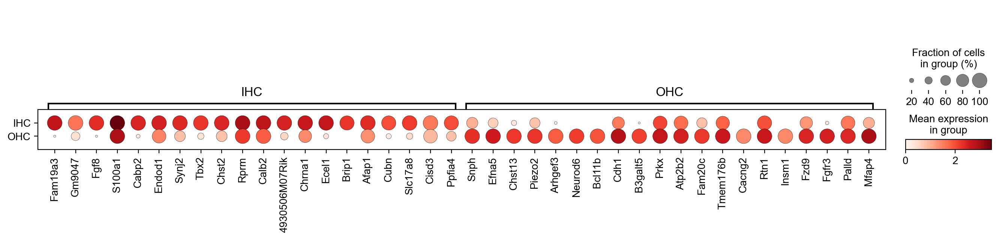

In [7]:
sc.pl.rank_genes_groups_dotplot(adata,n_genes=20)

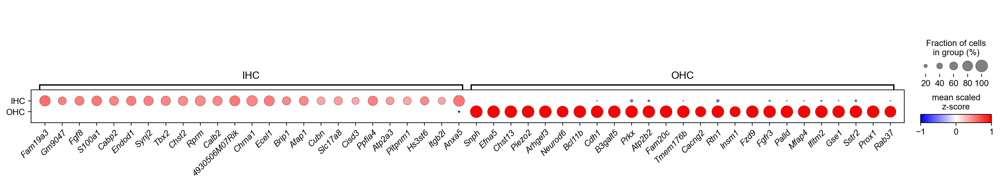

In [8]:
ax=sc.pl.rank_genes_groups_dotplot(adata,n_genes=25,layer="scaled",cmap="bwr", colorbar_title='mean scaled\nz-score',vmin=-1,vmax=1,show=False)
plt.setp(ax['mainplot_ax'].get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor",style="italic");
plt.savefig("figures/fig5d.pdf")

In [9]:
import subprocess
files=["figures/fig5a.pdf","figures/fig5b.pdf","HC_validations.pdf"]
file=files[0]

def get_ratio(file):
    command=('identify %s'%file).split()
    arr=np.array(subprocess.check_output(command).decode("utf-8").split(" ")[2].split("x"),dtype=int)
    return arr[0]/arr[1]

ratios=np.array([get_ratio(file) for file in files])
sum_ratios=ratios.sum()

In [10]:
a,b,c=(ratios/sum_ratios)-0.01

In [11]:
pvals=pd.read_table("cellphonedb/pvalues.txt")
means=pd.read_table("cellphonedb/means.txt")
pvals.set_index("interacting_pair",inplace=True)
means.set_index("interacting_pair",inplace=True)

In [12]:
pvals

,id_cp_interaction,partner_a,partner_b,gene_a,gene_b,secreted,receptor_a,receptor_b,annotation_strategy,is_integrin,...,OHC|2,OHC|3,OHC|4,OHC|5,OHC|6,OHC|7,OHC|8,OHC|9,OHC|IHC,OHC|OHC
interacting_pair,,,,,,,,,,,,,,,,,,,,,
KLRG2_WNT11,CPI-SS0A7B487D4,simple:A4D1S0,simple:O96014,KLRG2,WNT11,True,True,False,InnateDB-All,False,...,1.0,1.0,1.000,1.0,1.0,1.0,1.0,1.0,1.0,1.0
KLRG2_TNFSF9,CPI-SS0FEC87269,simple:A4D1S0,simple:P41273,KLRG2,TNFSF9,True,True,False,InnateDB-All,False,...,1.0,1.0,1.000,1.0,1.0,1.0,1.0,1.0,1.0,1.0
KLRG2_WNT5B,CPI-SS044DF8749,simple:A4D1S0,simple:Q9H1J7,KLRG2,WNT5B,True,True,False,InnateDB-All,False,...,1.0,1.0,1.000,1.0,1.0,1.0,1.0,1.0,1.0,1.0
GALR2_GAL,CPI-SS0F8ABC300,simple:O43603,simple:P22466,GALR2,GAL,True,True,False,guidetopharmacology.org,False,...,1.0,1.0,0.000,1.0,0.0,0.0,0.0,0.0,1.0,1.0
GALR3_GAL,CPI-SS0E70DD97F,simple:O60755,simple:P22466,GALR3,GAL,True,True,False,guidetopharmacology.org,False,...,1.0,1.0,1.000,1.0,1.0,1.0,1.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CRLF2_TSLPR,CPI-SC047CEF2DD,simple:Q9HC73,complex:TSLPR,CRLF2,NaN,True,True,True,curated,False,...,1.0,1.0,1.000,1.0,1.0,1.0,1.0,1.0,1.0,1.0
ESAM_ESAM,CPI-SS04C672963,simple:Q96AP7,simple:Q96AP7,ESAM,ESAM,False,False,False,curated,False,...,1.0,1.0,1.000,1.0,1.0,1.0,1.0,1.0,1.0,1.0
GPHA2_EPHA6,CPI-SS08C78576B,simple:Q96T91,simple:Q9UF33,GPHA2,EPHA6,True,False,True,InnateDB-All,False,...,1.0,1.0,1.000,1.0,0.0,1.0,0.0,0.0,1.0,1.0


In [13]:
ohc=["OHC|"+l for l in ["9","11","12","14","16"]]+[l+"|OHC" for l in ["9","11","12","14","16"]]
ihc=["IHC|"+l for l in ["11","12","14","16"]]+[l+"|IHC" for l in ["11","12","14","16"]]

In [14]:
pvals_ohc=pvals[ohc]
means_ohc=means[ohc]
means_ohc=means_ohc.loc[(pvals_ohc<0.05).apply(any,axis=1)]
pvals_ohc=pvals_ohc.loc[(pvals_ohc<0.05).apply(any,axis=1)]
pvals_ohc[pvals_ohc==0]=0.0009
mask=pvals_ohc<0.05
pvals_ohc=-np.log10(pvals_ohc)
pvals_ohc=pvals_ohc/pvals_ohc.max().max()*200

In [15]:
sel1=((pvals_ohc>0).iloc[:,5:].apply(any,axis=1) & pvals.loc[pvals_ohc.index].receptor_a)
sel2=((pvals_ohc>0).iloc[:,:5].apply(any,axis=1) & pvals.loc[pvals_ohc.index].receptor_b)
sel3=~pvals.loc[pvals_ohc.index,["receptor_a","receptor_b"]].apply(any,axis=1)

In [16]:
sel3.index[sel3]

Index(['CRTAM_CADM1', 'CADM3_CADM4', 'ALOX5_ALOX5AP'], dtype='object', name='interacting_pair')

In [17]:
pvals_ohc = pvals_ohc.loc[(sel1 | sel2 | sel3)]

In [18]:
means_ohc = means_ohc.loc[pvals_ohc.index]

In [19]:
from matplotlib import cm
from matplotlib.cm import Reds
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

def dotplot(pvals,means,legend=True,color="k"):

    fig,ax=plt.subplots(figsize=(pvals.shape[1]/3,0.3*pvals.shape[0]))

    xs = np.arange(pvals.shape[0])
    ys = np.arange(pvals.shape[1])
    X, Y = np.meshgrid(xs, ys)

    sc=ax.scatter(
        Y, X, s=pvals.values.T,c=means.values.T,cmap="Reds"
    )
    ax.set_ylim([-0.5,pvals.shape[0]-0.5]);
    ax.set_yticks(range(pvals.shape[0]));
    ax.set_yticklabels(pvals.index);

    ax.set_xticks(range(pvals.shape[1]));
    ax.set_xticklabels(pvals.columns,rotation=45,ha="right",va="top",color=color);
    ax.set_xlim([-0.5,pvals.shape[1]-0.5]);
    if legend:
        handles, labels = sc.legend_elements(prop="sizes",num=4)
        legend = ax.legend(handles, ["0.75","1.5","2.25","3"], title="-log10(pval)",frameon=False,
                           loc='center left', bbox_to_anchor=(1, 0.5),handlelength=2, borderpad=1.2)
        legend._legend_box.align = "left"
        mappable = cm.ScalarMappable(cmap=Reds)
    
    
        position = inset_axes(ax, width=0.2, height=1,
                        bbox_to_anchor=(1.04, .5-3/fig.get_size_inches()[1]),
                        bbox_transform=ax.transAxes, loc=3, borderpad=1.2)

        #position=fig.add_axes([1.04,0.4,.5/fig.get_size_inches()[1],2/fig.get_size_inches()[1]])
        cbar=fig.colorbar(mappable, cax=position,orientation='vertical',aspect=50)
        cbar.set_ticks([0,1])
        cbar.set_ticklabels([0,means.max().max()])
        cbar.ax.set_title("log2 mean(mol1,mol2)",loc="left")

In [20]:
scv.set_figure_params(figsize=(3.5,3.5))

In [21]:
pvals.loc[["FGFR3_FGF23"]]

,id_cp_interaction,partner_a,partner_b,gene_a,gene_b,secreted,receptor_a,receptor_b,annotation_strategy,is_integrin,...,OHC|2,OHC|3,OHC|4,OHC|5,OHC|6,OHC|7,OHC|8,OHC|9,OHC|IHC,OHC|OHC
interacting_pair,,,,,,,,,,,,,,,,,,,,,
FGFR3_FGF23,CPI-SS0883B7EE4,simple:P22607,simple:Q9GZV9,FGFR3,FGF23,True,True,False,I2D,False,...,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0


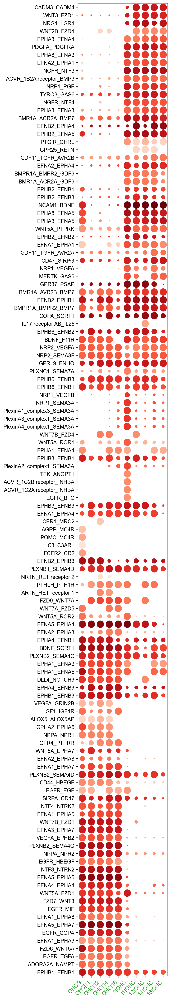

In [22]:
res=[]
for i in range(pvals_ohc.shape[0]):
    res=res+[(pvals_ohc.iloc[i,:5].std()==0) & (pvals_ohc.iloc[i,5:].std()==0)]
pvals_sel=pvals_ohc.loc[~np.array(res)]
means_sel=means_ohc.loc[~np.array(res)]

ordered=pvals_sel.T.corr().iloc[0,:].sort_values().index
dotplot(pvals_ohc.loc[ordered],means_ohc.loc[ordered],legend=False,color="tab:green")
plt.savefig("figures/cpdb_ohc_sel.pdf",bbox_inches="tight")

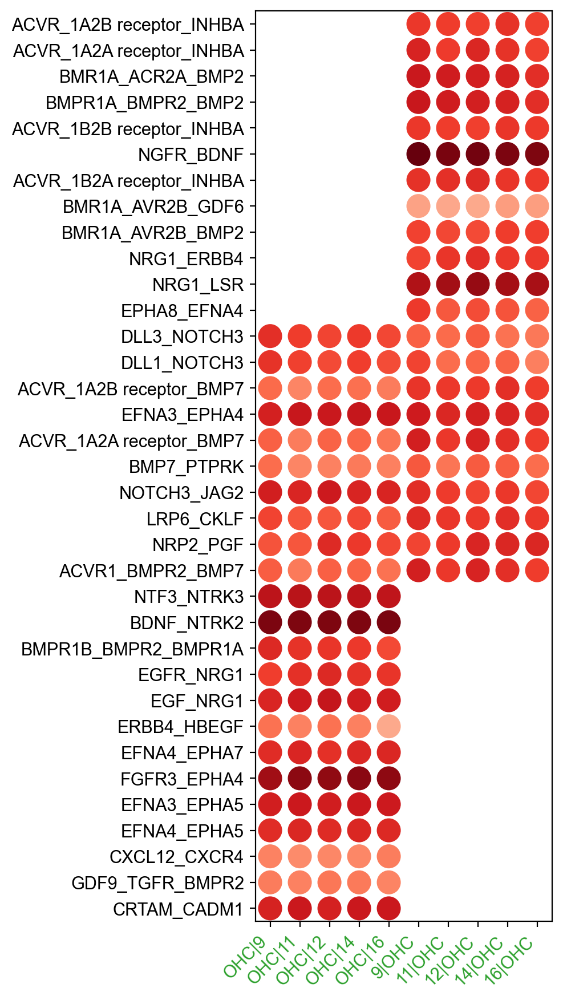

In [23]:
pvals_sel=pvals_ohc.loc[np.array(res)]
means_sel=means_ohc.loc[np.array(res)]

ordered=pvals_sel.apply(lambda x:  np.average(range(pvals_sel.shape[1]),weights=x),axis=1).sort_values().index
#ordered=pvals_sel.sort_index().index
dotplot(pvals_ohc.loc[ordered],means_ohc.loc[ordered],legend=False,color="tab:green")
plt.savefig("figures/cpdb_ohc_full.pdf",bbox_inches="tight")

In [24]:
pvals_sel.to_csv("pvals_ohc_gen.csv")

In [25]:
ohc_sel=pd.read_table("ohc_selection.tsv",header=None,index_col=0).squeeze()

In [26]:
dfps=list()
dfms=list()
for i in ohc_sel.index:
    if ohc_sel.loc[i]=="f":
        df=pvals_ohc.loc[i].iloc[:5]
        dfps.append(df)
        dfm=means_ohc.loc[i].iloc[:5]
        dfms.append(dfm)
    elif ohc_sel.loc[i]=="r":
        df=pvals_ohc.loc[i].iloc[5:]
        dfm=means_ohc.loc[i].iloc[5:]
        dfm.index=pvals_ohc.columns[:5]
        df.index=pvals_ohc.columns[:5]
        torev=pvals_ohc.loc[i].iloc[5:].name.split("_")
        if len(torev)==3:
            torev=["_".join([torev[0],torev[1]]),torev[2]]
        df.name="_".join(torev[::-1])
        dfm.name="_".join(torev[::-1])
        dfps.append(df)
        dfms.append(dfm)
    elif ohc_sel.loc[i]=="b":
        df=pvals_ohc.loc[i].iloc[:5]
        dfm=means_ohc.loc[i].iloc[:5]
        dfps.append(df)
        dfms.append(dfm)
        df=pvals_ohc.loc[i].iloc[5:]
        dfm=means_ohc.loc[i].iloc[5:]
        dfm.index=pvals_ohc.columns[:5]
        df.index=pvals_ohc.columns[:5]
        torev=pvals_ohc.loc[i].iloc[5:].name.split("_")
        if len(torev)==3:
            torev=["_".join([torev[0],torev[1]]),torev[2]]
        df.name="_".join(torev[::-1])
        dfm.name="_".join(torev[::-1])
        dfps.append(df)
        dfms.append(dfm)

In [27]:
means_ohc_highlight=pd.concat(dfms,axis=1).T
pvals_ohc_highlight=pd.concat(dfps,axis=1).T

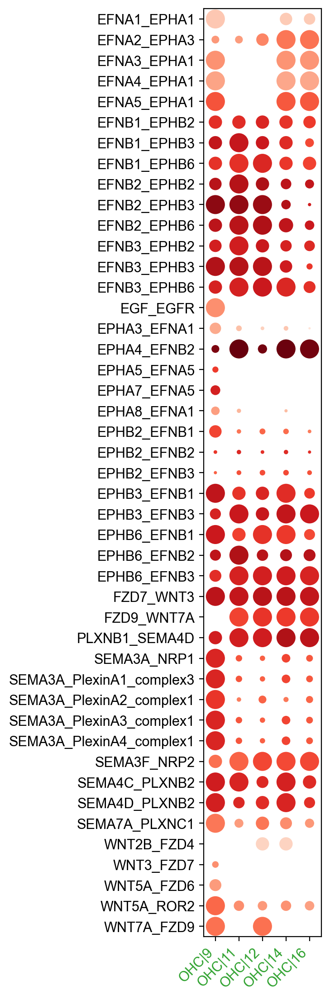

In [28]:
ordered=pvals_ohc_highlight.sort_index(ascending=False).index

dotplot(pvals_ohc_highlight.loc[ordered],means_ohc_highlight.loc[ordered],legend=False,color="tab:green")
plt.savefig("figures/cpdb_ohc_highlight.pdf",bbox_inches="tight")

In [29]:
pvals_ihc=pvals[ihc]
means_ihc=means[ihc]
means_ihc=means_ihc.loc[(pvals_ihc<0.05).apply(any,axis=1)]
pvals_ihc=pvals_ihc.loc[(pvals_ihc<0.05).apply(any,axis=1)]
pvals_ihc[pvals_ihc==0]=0.0009
mask=pvals_ihc<0.05
pvals_ihc=-np.log10(pvals_ihc)
pvals_ihc=pvals_ihc/pvals_ihc.max().max()*200

In [30]:
sel1=((pvals_ihc>0).iloc[:,4:].apply(any,axis=1) & pvals.loc[pvals_ihc.index].receptor_a)
sel2=((pvals_ihc>0).iloc[:,:4].apply(any,axis=1) & pvals.loc[pvals_ihc.index].receptor_b)
sel3=~pvals.loc[pvals_ihc.index,["receptor_a","receptor_b"]].apply(any,axis=1)

In [31]:
sel3.index[sel3]

Index(['CRTAM_CADM1'], dtype='object', name='interacting_pair')

In [32]:
pvals_ihc = pvals_ihc.loc[(sel1 | sel2 | sel3)]

In [33]:
means_ihc = means_ihc.loc[pvals_ihc.index]

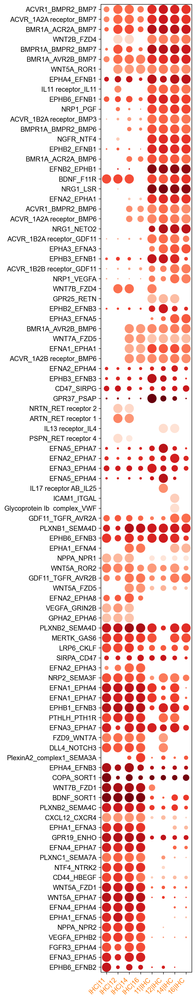

In [34]:
res=[]
for i in range(pvals_ihc.shape[0]):
    res=res+[(pvals_ihc.iloc[i,:4].std()==0) & (pvals_ihc.iloc[i,4:].std()==0)]
pvals_sel=pvals_ihc.loc[~np.array(res)]
means_sel=means_ihc.loc[~np.array(res)]

ordered=pvals_sel.T.corr().iloc[0,:].sort_values().index
dotplot(pvals_ihc.loc[ordered],means_ihc.loc[ordered],legend=False,color="tab:orange")
plt.savefig("figures/cpdb_ihc_sel.pdf",bbox_inches="tight")
pvals_sel.to_csv("pvals_ihc_spe.csv")

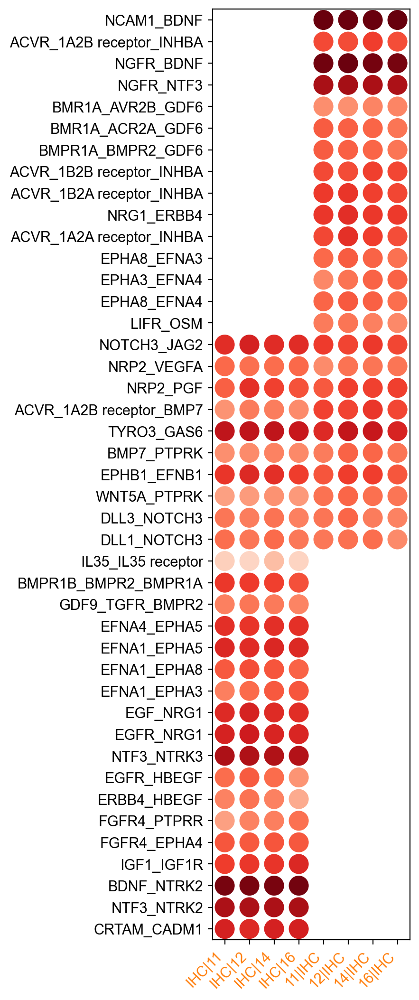

In [35]:
pvals_sel=pvals_ihc.loc[np.array(res)]
means_sel=means_ihc.loc[np.array(res)]

ordered=pvals_sel.T.corr().iloc[0,:].sort_values().index
ordered=pvals_sel.apply(lambda x:  np.average(range(pvals_sel.shape[1]),weights=x),axis=1).sort_values().index
dotplot(pvals_ihc.loc[ordered],means_ihc.loc[ordered],legend=False,color="tab:orange")
plt.savefig("figures/cpdb_ihc_full.pdf",bbox_inches="tight")
pvals_sel.to_csv("pvals_ihc_gen.csv")

In [36]:
#pvals_sel.to_csv("pvals_ohc_gen.csv")

In [37]:
ihc_sel=pd.read_table("ihc_selection.tsv",header=None,index_col=0).squeeze()

In [38]:
dfps=list()
dfms=list()
for i in ihc_sel.index:
    if ihc_sel.loc[i]=="f":
        df=pvals_ihc.loc[i].iloc[:4]
        dfps.append(df)
        dfm=means_ihc.loc[i].iloc[:4]
        dfms.append(dfm)
    elif ihc_sel.loc[i]=="r":
        df=pvals_ihc.loc[i].iloc[4:]
        dfm=means_ihc.loc[i].iloc[4:]
        dfm.index=pvals_ihc.columns[:4]
        df.index=pvals_ihc.columns[:4]
        torev=pvals_ihc.loc[i].iloc[4:].name.split("_")
        if len(torev)==3:
            torev=["_".join([torev[0],torev[1]]),torev[2]]
        df.name="_".join(torev[::-1])
        dfm.name="_".join(torev[::-1])
        dfps.append(df)
        dfms.append(dfm)
    elif ihc_sel.loc[i]=="b":
        df=pvals_ihc.loc[i].iloc[:4]
        dfm=means_ihc.loc[i].iloc[:4]
        dfps.append(df)
        dfms.append(dfm)
        df=pvals_ihc.loc[i].iloc[4:]
        dfm=means_ihc.loc[i].iloc[4:]
        dfm.index=pvals_ihc.columns[:4]
        df.index=pvals_ihc.columns[:4]
        torev=pvals_ihc.loc[i].iloc[4:].name.split("_")
        if len(torev)==3:
            torev=["_".join([torev[0],torev[1]]),torev[2]]
        df.name="_".join(torev[::-1])
        dfm.name="_".join(torev[::-1])
        dfps.append(df)
        dfms.append(dfm)

In [39]:
means_ihc_highlight=pd.concat(dfms,axis=1).T
pvals_ihc_highlight=pd.concat(dfps,axis=1).T

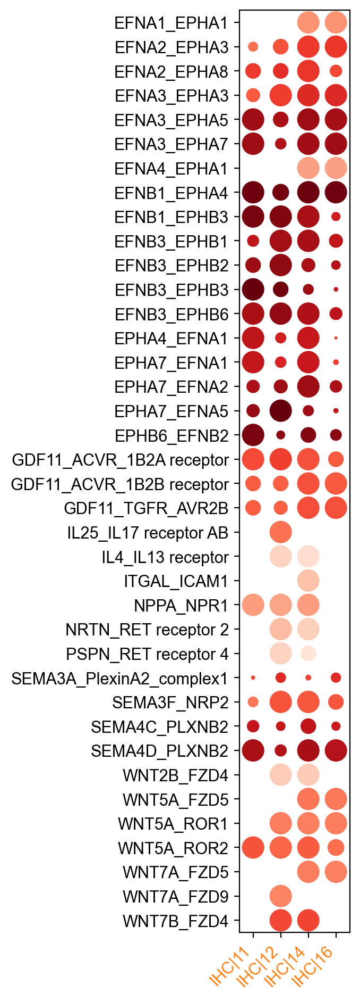

In [40]:
ordered=pvals_ihc_highlight.sort_index(ascending=False).index

dotplot(pvals_ihc_highlight.loc[ordered],means_ihc_highlight.loc[ordered],legend=False,color="tab:orange")
plt.savefig("figures/cpdb_ihc_highlight.pdf",bbox_inches="tight")

In [41]:
fname="fig5"

In [48]:
%%bash -s $fname $a $b $c
echo $2
cat<<EOF >$1.tex
\documentclass{article}
\usepackage[paperheight=250mm,paperwidth=210mm]{geometry}
\geometry{left=5mm,right=5mm,top=5mm,bottom=5mm,}
 
\usepackage[labelfont=bf]{caption}

\usepackage[rgb]{xcolor}
\usepackage{fontspec}
\usepackage[utf8]{inputenc}
\usepackage[T1]{fontenc}
\usepackage{graphbox,graphicx} 
\usepackage{adjustbox}

\begin{document}
\setmainfont{Arial}

\noindent
\large 

\fontsize{11pt}{11pt}\selectfont


\begin{minipage}[t]{$2\textwidth}
\raggedright \textbf{a} UMAP of Hair Cells
\includegraphics[width=\textwidth]{figures/fig5a.pdf}
\end{minipage}\hfill
\begin{minipage}[t]{$3\textwidth}
\raggedright \textbf{b} main Hair Cells markers
\includegraphics[width=\textwidth]{figures/fig5b.pdf}
\end{minipage}\hfill
\begin{minipage}[t]{$4\textwidth}
\raggedright \textbf{c} validations of markers
\includegraphics[width=\textwidth]{HC_validations.pdf}
\end{minipage}\hfill

\raggedright \textbf{d} top 25 DE genes between IHC and OHC
\includegraphics[trim=0 0 0 .7in,width=\textwidth]{figures/fig5d.pdf}

\raggedright \textbf{e} CellphoneDB results
\vspace{-10pt}
\begin{minipage}[t]{.5\textwidth}
\vspace{0pt}
\begin{minipage}[t]{.43\textwidth}
\vspace{0pt}
\includegraphics[width=\textwidth]{figures/cpdb_ihc_highlight.pdf}
\end{minipage}\hfill
\begin{minipage}[t]{.4\textwidth}
\vspace{0pt}
\includegraphics[width=\textwidth]{figures/cpdb_ohc_highlight.pdf}
\end{minipage}\hfill
\end{minipage}\hfill

\clearpage
EOF
echo "\end{document}" >> $1.tex

xelatex --shell-escape $1.tex
rm $1.tex
convert -flatten -density 300 $1.pdf $1.jpg

identify $1.pdf

0.25641310509421367
This is XeTeX, Version 3.14159265-2.6-0.999991 (TeX Live 2019/Debian) (preloaded format=xelatex)
 \write18 enabled.
entering extended mode
(./fig5.tex
LaTeX2e <2020-02-02> patch level 2
L3 programming layer <2020-02-14>
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2019/12/20 v1.4l Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size10.clo))
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/share/texlive/texmf-dist/tex/generic/iftex/ifvtex.sty
(/usr/share/texlive/texmf-dist/tex/generic/iftex/iftex.sty)))
(/usr/share/texlive/texmf-dist/tex/latex/caption/caption.sty
(/usr/share/texlive/texmf-dist/tex/latex/caption/caption3.sty))
(/usr/share/texlive/texmf-dist/tex/latex/xcolor/xcolor.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics-cfg/color.cfg)
(/usr/share/texlive/texmf-dist/tex/latex/graphics-def/xetex.def))
(/usr/shar

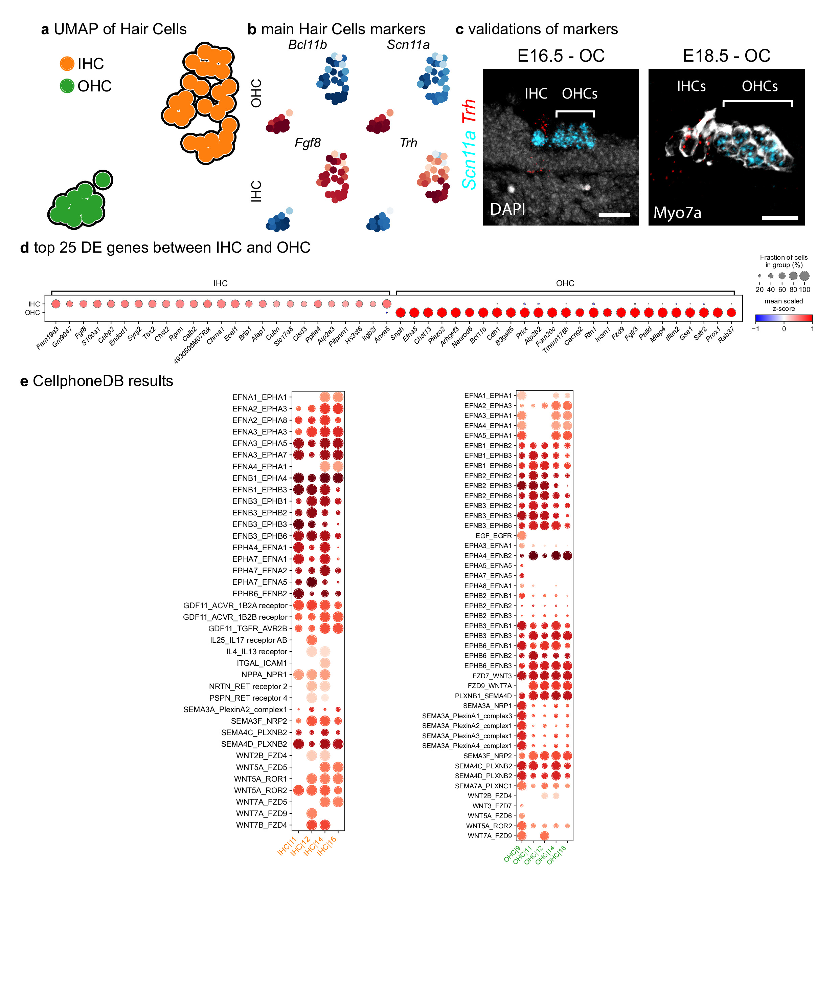

In [49]:
from IPython.display import Image
Image(filename=fname+'.jpg') 

In [50]:
fname="suppfig5"

In [59]:
%%bash -s $fname
cat<<EOF >$1.tex
\documentclass{article}
\usepackage[paperheight=430mm,paperwidth=210mm]{geometry}
\geometry{left=5mm,right=5mm,top=5mm,bottom=5mm,}
 
\usepackage[labelfont=bf]{caption}

\usepackage[rgb]{xcolor}
\usepackage{fontspec}
\usepackage[utf8]{inputenc}
\usepackage[T1]{fontenc}
\usepackage{graphbox,graphicx} 
\usepackage{adjustbox}

\begin{document}
\setmainfont{Arial}

\noindent
\large 

\fontsize{11pt}{11pt}\selectfont


\begin{minipage}[t]{\textwidth}
\vspace{0pt}
\raggedright \textbf{a} CellphoneDB results
\end{minipage}\hfill
\begin{minipage}[t]{.34\textwidth}
\vspace{0pt}
\includegraphics[width=\textwidth]{figures/cpdb_ihc_sel.pdf}
\end{minipage}\hfill
\begin{minipage}[t]{.34\textwidth}
\vspace{0pt}
\includegraphics[width=\textwidth]{figures/cpdb_ohc_sel.pdf}
\end{minipage}\hfill
\begin{minipage}[t]{.32\textwidth}
\vspace{0pt}
\includegraphics[width=\textwidth]{figures/cpdb_ihc_full.pdf}
\vspace{0pt}
\includegraphics[width=\textwidth]{figures/cpdb_ohc_full.pdf}
\end{minipage}\hfill

\clearpage
EOF
echo "\end{document}" >> $1.tex

xelatex --shell-escape $1.tex
rm $1.tex
convert -flatten -density 300 $1.pdf $1.jpg

identify $1.pdf

This is XeTeX, Version 3.14159265-2.6-0.999991 (TeX Live 2019/Debian) (preloaded format=xelatex)
 \write18 enabled.
entering extended mode
(./suppfig5.tex
LaTeX2e <2020-02-02> patch level 2
L3 programming layer <2020-02-14>
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2019/12/20 v1.4l Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size10.clo))
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/share/texlive/texmf-dist/tex/generic/iftex/ifvtex.sty
(/usr/share/texlive/texmf-dist/tex/generic/iftex/iftex.sty)))
(/usr/share/texlive/texmf-dist/tex/latex/caption/caption.sty
(/usr/share/texlive/texmf-dist/tex/latex/caption/caption3.sty))
(/usr/share/texlive/texmf-dist/tex/latex/xcolor/xcolor.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics-cfg/color.cfg)
(/usr/share/texlive/texmf-dist/tex/latex/graphics-def/xetex.def))
(/usr/share/texlive/texmf-

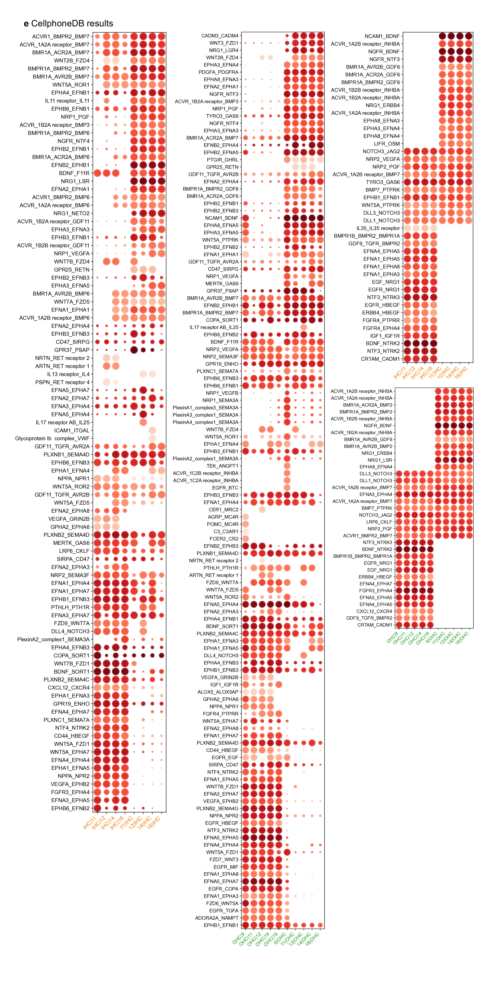

In [58]:
from IPython.display import Image
Image(filename=fname+'.jpg') 

In [64]:
adata=sc.read("data/adata_aligned.h5ad")
adata_HC=sc.read("data/adata_HC.h5ad")

In [65]:
adata.obs["annot"]=adata.obs.leiden.astype(str)
adata_HC.obs.leiden=adata_HC.obs.leiden.replace(["0","1"],["IHC","OHC"])

In [66]:
adata.obs["HC"]="none"
adata.obs.loc[adata_HC.obs_names,"HC"]=adata_HC.obs.leiden.values

In [67]:
def add_subplot_axes(ax,rect):
    fig = plt.gcf()
    box = ax.get_position()
    width = box.width
    height = box.height
    inax_position  = ax.transAxes.transform(rect[0:2])
    transFigure = fig.transFigure.inverted()
    infig_position = transFigure.transform(inax_position)    
    x = infig_position[0]
    y = infig_position[1]
    width *= rect[2]
    height *= rect[3]  # <= Typo was here
    #subax = fig.add_axes([x,y,width,height],facecolor=facecolor)  # matplotlib 2.0+
    subax = fig.add_axes([x,y,width,height])
    x_labelsize = subax.get_xticklabels()[0].get_size()
    y_labelsize = subax.get_yticklabels()[0].get_size()
    x_labelsize *= rect[2]**0.5
    y_labelsize *= rect[3]**0.5
    subax.xaxis.set_tick_params(labelsize=x_labelsize)
    subax.yaxis.set_tick_params(labelsize=y_labelsize)
    return subax

In [68]:
adata_HC.obsm["X_umap"].min(axis=0)

array([4.6654243, 7.6155643], dtype=float32)

In [69]:
adata_HC.obsm["X_umap"][adata_HC.obs.leiden=="IHC"].mean(axis=0)

array([15.466104, 14.66896 ], dtype=float32)

In [70]:
tuple(adata_HC.obsm["X_umap"][adata_HC.obs.leiden=="IHC"].mean(axis=0))

(15.466104, 14.66896)

In [71]:
scv

<module 'scvelo' from '/home/lfaure/miniconda3/envs/bio-gpu-18/lib/python3.8/site-packages/scvelo/__init__.py'>

... storing 'leiden' as categorical


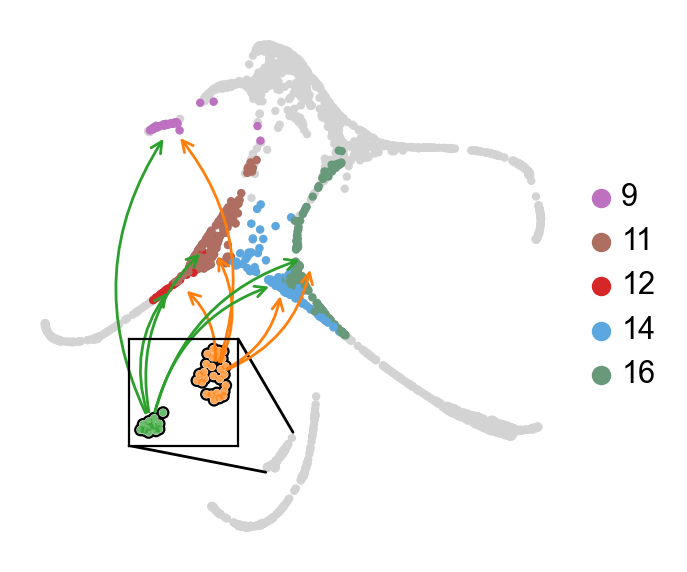

In [72]:
from matplotlib.patches import ConnectionPatch, Rectangle
fig,ax=plt.subplots()
scv.pl.draw_graph(adata,color="leiden",groups=["9","11","12","14","16"],
                 title="",ax=ax,show=False,frameon=False,legend_loc="right")
rect = [0.2,0.2,0.2,0.2]
ax1 = add_subplot_axes(ax,rect)
sc.pl.umap(adata_HC,color="leiden",palette=["tab:orange","tab:green"],ax=ax1,
           show=False,title="",s=30,legend_loc="none",add_outline=True)
ax1.set_xlabel("")
ax1.set_ylabel("")
ax1.set_xlim([3,19])
ax1.set_ylim([6,19])
con1 = ConnectionPatch(xyA=(0.5, .225), coordsA="axes fraction", 
                       xyB=(1, 1), coordsB="axes fraction", axesA=ax,axesB=ax1)
ax.add_artist(con1)

con1 = ConnectionPatch(xyA=(0.45, .15), coordsA="axes fraction", 
                       xyB=(0, 0), coordsB="axes fraction", axesA=ax,axesB=ax1)
ax.add_artist(con1)


for l in ["9","11","12","14","16"]:
    con1 = ConnectionPatch(xyA=tuple(adata_HC.obsm["X_umap"][adata_HC.obs.leiden=="IHC"].mean(axis=0)), coordsA="data", 
                       xyB=tuple(adata.obsm["X_draw_graph_fa"][adata.obs.leiden==l].mean(axis=0)), coordsB="data", 
                       axesA=ax1,axesB=ax,connectionstyle="arc3,rad=.3",arrowstyle="->", color="tab:orange",
                                shrinkA=5, shrinkB=5,
                                patchA=None, patchB=None)
    ax1.add_artist(con1)
    
for l in ["9","11","12","14","16"]:
    con1 = ConnectionPatch(xyA=tuple(adata_HC.obsm["X_umap"][adata_HC.obs.leiden=="OHC"].mean(axis=0)), coordsA="data", 
                       xyB=tuple(adata.obsm["X_draw_graph_fa"][adata.obs.leiden==l].mean(axis=0)), coordsB="data", 
                       axesA=ax1,axesB=ax,connectionstyle="arc3,rad=-.3",arrowstyle="->", color="tab:green",
                                shrinkA=5, shrinkB=5,
                                patchA=None, patchB=None)
    ax1.add_artist(con1)
plt.savefig("figures/fig5e-2.pdf")

In [73]:
%%bash -s $fname $a $b $c
echo $2
cat<<EOF >$1.tex
\documentclass{article}
\usepackage[paperheight=350mm,paperwidth=210mm]{geometry}
\geometry{left=5mm,right=5mm,top=5mm,bottom=5mm,}
 
\usepackage[labelfont=bf]{caption}

\usepackage[rgb]{xcolor}
\usepackage{fontspec}
\usepackage[utf8]{inputenc}
\usepackage[T1]{fontenc}
\usepackage{graphbox,graphicx} 
\usepackage{adjustbox}

\begin{document}
\setmainfont{Arial}

\noindent
\large 

\fontsize{11pt}{11pt}\selectfont


\begin{minipage}[t]{$2\textwidth}
\raggedright \textbf{a} UMAP of Hair Cells
\includegraphics[width=\textwidth]{figures/fig5a.pdf}
\end{minipage}\hfill
\begin{minipage}[t]{$3\textwidth}
\raggedright \textbf{b} main Hair Cells markers
\includegraphics[width=\textwidth]{figures/fig5b.pdf}
\end{minipage}\hfill
\begin{minipage}[t]{$4\textwidth}
\raggedright \textbf{c} validations of markers
\includegraphics[width=\textwidth]{HC_validations.pdf}
\end{minipage}\hfill

\raggedright \textbf{d} top 25 DE genes between IHC and OHC
\includegraphics[trim=0 0 0 .7in,width=\textwidth]{figures/fig5d.pdf}

\vspace{-10pt}
\begin{minipage}[t]{\textwidth}
\vspace{0pt}
\raggedright \textbf{e} CellphoneDB results
\end{minipage}\hfill
\begin{minipage}[t]{.24\textwidth}
\vspace{0pt}
\includegraphics[width=\textwidth]{figures/cpdb_ihc_sel.pdf}
\end{minipage}\hfill
\begin{minipage}[t]{.24\textwidth}
\vspace{0pt}
\includegraphics[width=\textwidth]{figures/cpdb_ohc_sel.pdf}
\end{minipage}\hfill
\begin{minipage}[t]{.49\textwidth}
\vspace{0pt}
\includegraphics[width=.5\textwidth,trim= 0 .4in 0 0]{figures/fig5e-2.pdf}
\begin{minipage}[t]{\textwidth}
\begin{minipage}[t]{.49\textwidth}
\vspace{0pt}
\includegraphics[width=\textwidth]{figures/cpdb_ihc_full.pdf}
\end{minipage}\hfill
\begin{minipage}[t]{.49\textwidth}
\vspace{0pt}
\includegraphics[width=\textwidth]{figures/cpdb_ohc_full.pdf}
\end{minipage}\hfill
\end{minipage}\hfill
\end{minipage}\hfill

\clearpage
EOF
echo "\end{document}" >> $1.tex

xelatex --shell-escape $1.tex
rm $1.tex
convert -flatten -density 300 $1.pdf $1.jpg

identify $1.pdf

0.25641310509421367
This is XeTeX, Version 3.14159265-2.6-0.999991 (TeX Live 2019/Debian) (preloaded format=xelatex)
 \write18 enabled.
entering extended mode
(./fig5.tex
LaTeX2e <2020-02-02> patch level 2
L3 programming layer <2020-02-14>
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2019/12/20 v1.4l Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size10.clo))
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/share/texlive/texmf-dist/tex/generic/iftex/ifvtex.sty
(/usr/share/texlive/texmf-dist/tex/generic/iftex/iftex.sty)))
(/usr/share/texlive/texmf-dist/tex/latex/caption/caption.sty
(/usr/share/texlive/texmf-dist/tex/latex/caption/caption3.sty))
(/usr/share/texlive/texmf-dist/tex/latex/xcolor/xcolor.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics-cfg/color.cfg)
(/usr/share/texlive/texmf-dist/tex/latex/graphics-def/xetex.def))
(/usr/shar

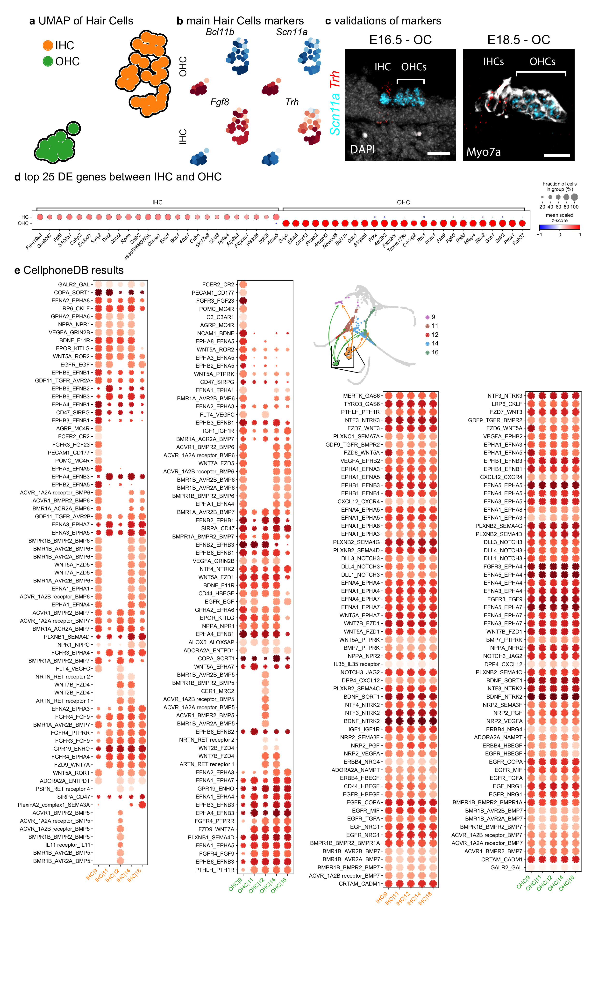

In [74]:
from IPython.display import Image
Image(filename=fname+'.jpg') 

In [99]:
sc.tl.rank_genes_groups(adata,"leiden",groups=["12","11"],method="wilcoxon")

In [75]:
sc.tl.rank_genes_groups(adata,"leiden",groups=["11"],reference="12")

In [100]:
sc.get.rank_genes_groups_df(adata,"11",pval_cutoff=.05)

,names,scores,logfoldchanges,pvals,pvals_adj
0,Ppl,19.404175,5.089346,7.115206e-84,1.472776e-79
1,Snhg11,18.563631,2.430390,6.327902e-77,6.549062e-73
2,Rbfox1,17.738821,2.365021,2.103013e-70,1.451009e-66
3,Syt7,17.392433,2.423591,9.414979e-68,4.872016e-64
4,Syt17,17.250250,3.501327,1.114176e-66,4.612466e-63
...,...,...,...,...,...
5255,Ckmt1,-11.721641,-2.571488,9.874104e-32,2.620309e-29
5256,Mir6236,-11.780759,-1.138166,4.904946e-32,1.318539e-29
5257,Pou4f1,-12.346598,-3.680924,5.081523e-35,1.669563e-32
5258,Lphn2,-12.671131,-1.533449,8.547300e-37,3.159296e-34


In [97]:
sc.get.rank_genes_groups_df(adata,"12",pval_cutoff=.05)

,names,scores,logfoldchanges,pvals,pvals_adj
0,Cpne6,9.558979,4.252230,1.189238e-21,2.461603e-17
1,Cpne4,9.172153,3.844977,4.636663e-20,4.798714e-16
2,Amigo2,8.874185,5.927985,7.044776e-19,4.860661e-15
3,Cdh22,8.719817,5.532663,2.786520e-18,1.441955e-14
4,Cntn5,8.339087,3.598534,7.486630e-17,3.099315e-13
...,...,...,...,...,...
1129,Lars2,-5.589530,-0.574898,2.276853e-08,4.488437e-06
1130,Cited2,-5.683577,-2.148961,1.319062e-08,2.874027e-06
1131,Ntm,-5.801493,-2.327947,6.572697e-09,1.639136e-06
1132,Malat1,-6.350471,-0.494166,2.146572e-10,9.873753e-08


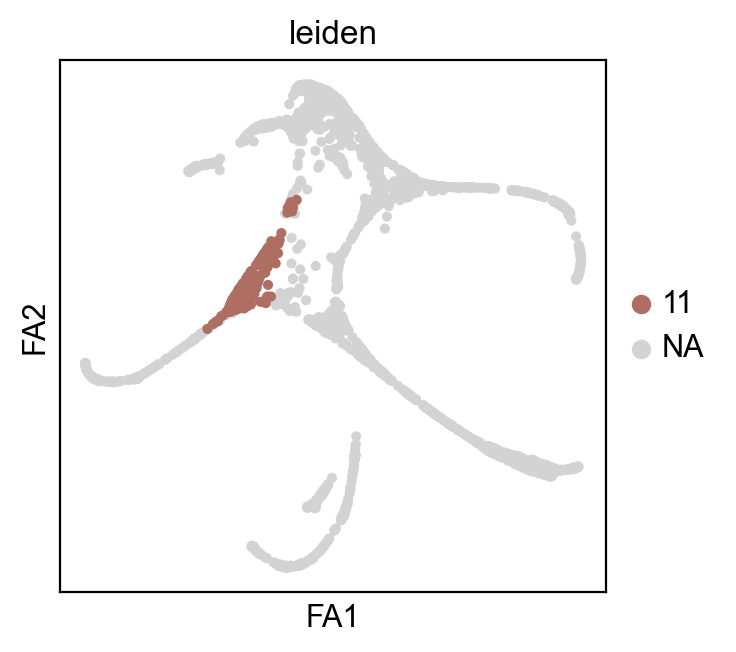

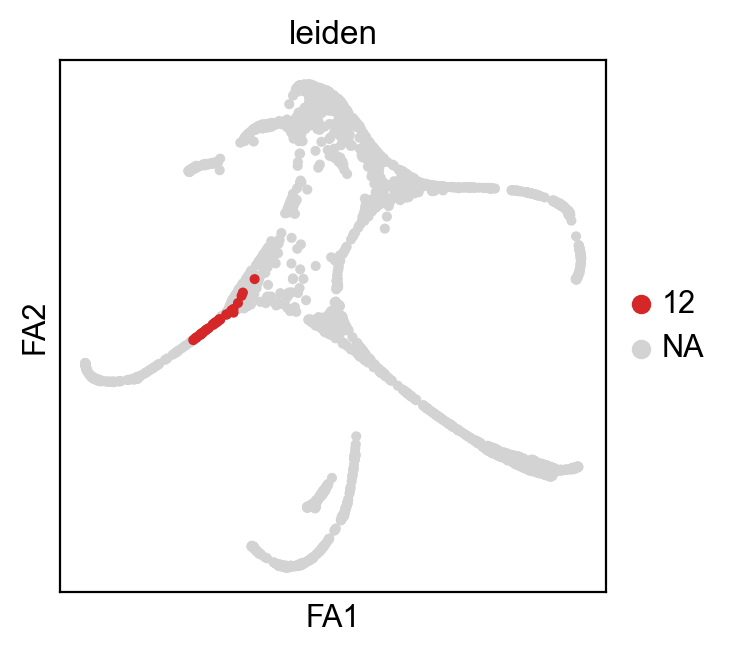

In [89]:
sc.pl.draw_graph(adata,color="leiden",groups=["11"])

sc.pl.draw_graph(adata,color="leiden",groups=["12"])

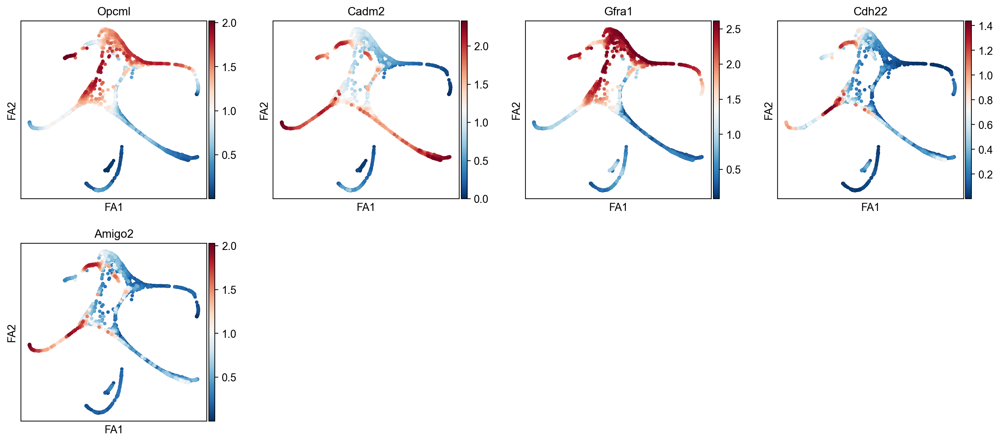

In [98]:
sc.pl.draw_graph(adata,color=["Opcml","Cadm2","Gfra1","Cdh22","Amigo2"],layer="palantir_imp")